<a href="https://colab.research.google.com/github/onikasbarbz/AI-ML/blob/main/2408634_Luniva_Shrestha_Worksheet1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Worksheet 1

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Exercise 1

In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

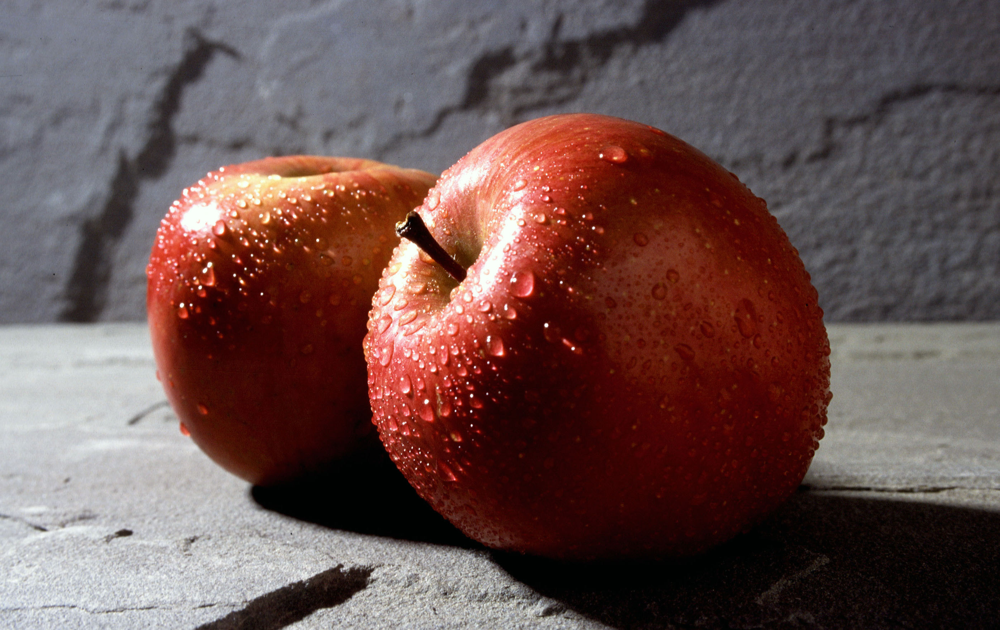

In [ ]:
image = Image.open('/content/drive/MyDrive/AL and ML/apple.jpg')
display(image)

In [ ]:
print(len( image . getbands () ))

3


In [ ]:
image_array = np.array(image)

array([[[119, 117, 131],
        [120, 118, 132],
        [119, 117, 131],
        ...,
        [118, 116, 129],
        [117, 117, 129],
        [117, 117, 129]],

       [[119, 117, 131],
        [119, 117, 131],
        [118, 116, 130],
        ...,
        [116, 114, 127],
        [116, 116, 128],
        [117, 117, 129]],

       [[117, 116, 132],
        [116, 115, 131],
        [116, 115, 131],
        ...,
        [115, 113, 126],
        [116, 116, 128],
        [118, 118, 130]],

       ...,

       [[113, 115, 128],
        [102, 104, 117],
        [107, 109, 122],
        ...,
        [126, 129, 146],
        [126, 129, 146],
        [122, 125, 144]],

       [[111, 113, 126],
        [104, 106, 119],
        [108, 110, 123],
        ...,
        [125, 128, 143],
        [125, 128, 145],
        [122, 125, 142]],

       [[111, 113, 126],
        [109, 111, 124],
        [110, 112, 125],
        ...,
        [124, 127, 142],
        [124, 127, 142],
        [121, 124, 141]]], dtype=uint8)
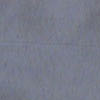

In [ ]:
top_left = image_array[0:100,0:100]
display(top_left)

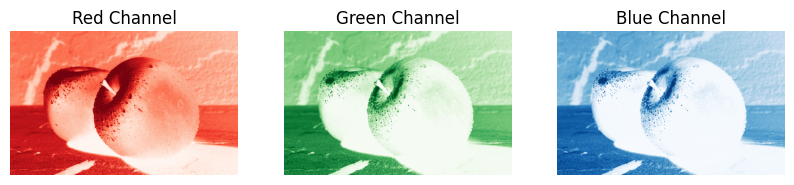

In [ ]:
R = image_array[:, :, 0]
G = image_array[:, :, 1]
B = image_array[:, :, 2]

plt.figure(figsize=(10,3))

plt.subplot(1,3,1)
plt.imshow(R, cmap='Reds')
plt.title("Red Channel")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(G, cmap='Greens')
plt.title("Green Channel")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(B, cmap='Blues')
plt.title("Blue Channel")
plt.axis("off")

plt.show()

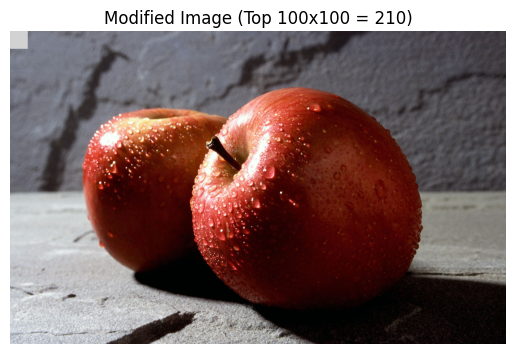

In [ ]:
# Modified image with top left corner gray
modified = image_array.copy()
modified[0:100, 0:100] = 210
plt.imshow(modified)
plt.title("Modified Image (Top 100x100 = 210)")
plt.axis("off")
plt.show()

## Exercise 2

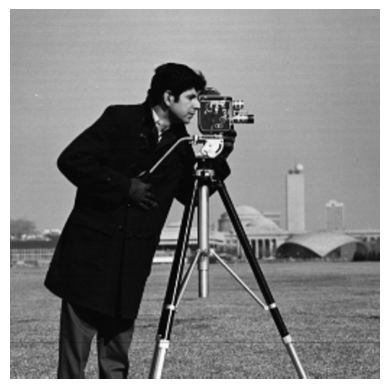

In [ ]:
img_grayscale = Image.open('/content/drive/MyDrive/AL and ML/cameraman.png')
plt.imshow(img_grayscale, cmap='gray')
plt.axis("off")
plt.show()

In [ ]:
img_array = np.array(img_grayscale)
print(img_array.shape)

(512, 512)


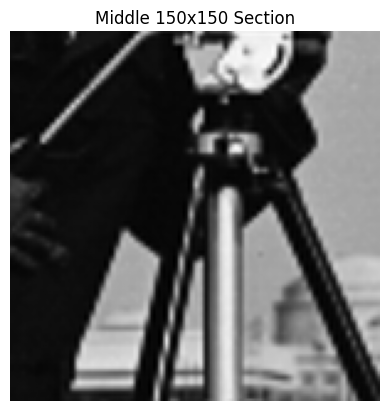

In [ ]:
h,w = img_array.shape
center_h = h//2
center_w = w//2
middle_section = img_array[center_h-75:center_h+75, center_w-75:center_w+75]
plt.imshow(middle_section, cmap="gray")
plt.title("Middle 150x150 Section")
plt.axis("off")
plt.show()

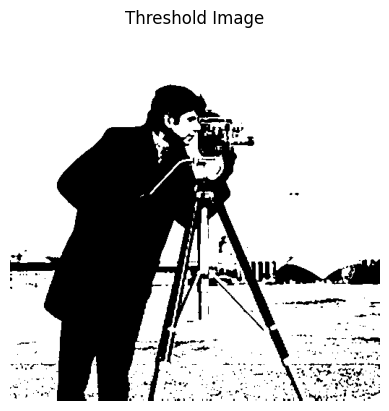

In [ ]:
binary_image = img_array.copy()
binary_image[binary_image < 100] = 0
binary_image[binary_image >= 100] = 255
plt.imshow(binary_image, cmap="gray")
plt.title("Threshold Image")
plt.axis("off")
plt.show()

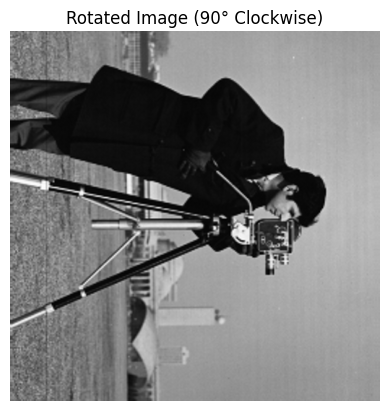

In [ ]:
rotated_image = img_grayscale.rotate(-90)
plt.imshow(rotated_image, cmap="gray")
plt.title("Rotated Image (90° Clockwise)")
plt.axis("off")
plt.show()

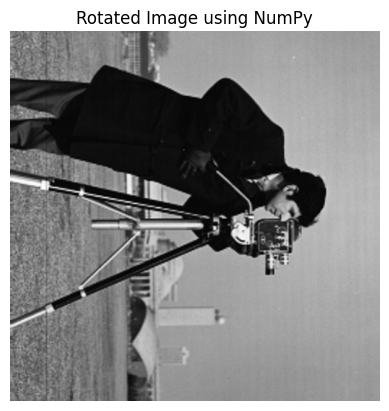

In [ ]:
rotated_array = np.rot90(img_array, -1)
plt.imshow(rotated_array, cmap="gray")
plt.title("Rotated Image using NumPy")
plt.axis("off")
plt.show()

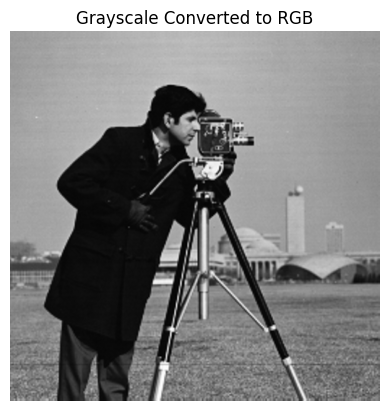

In [ ]:
rgb_image = np.stack((img_array,)*3, axis=-1)
plt.imshow(rgb_image)
plt.title("Grayscale Converted to RGB")
plt.axis("off")
plt.show()

In [ ]:
image_from_array = Image.fromarray(rgb_image)
print(image_from_array.getbands())

('R', 'G', 'B')


## Exercise 3

/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


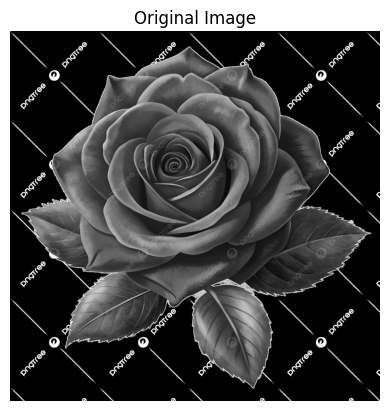

In [ ]:
#Converting to grayscale
image = Image.open('/content/drive/MyDrive/AL and ML/flower.png').convert("L")
img_array = np.array(image, dtype=float)
plt.imshow(img_array, cmap="gray")
plt.title("Original Image")
plt.axis("off")
plt.show()

In [ ]:
print(img_array.shape)

(2500, 2500)


In [ ]:
height,width = img_array.shape
data = img_array.reshape(height,width)

In [ ]:
mean = np.mean(data, axis=0)
centered_data = data - mean

In [ ]:
cov_matrix = np.cov(centered_data, rowvar=False)

In [ ]:
# Computing eigenvalues and eigenvectors
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

In [ ]:
# Sorting eigen values and vectors in descending order
sorted_index = np.argsort(eigenvalues)[::-1]
sorted_eigenvalues = eigenvalues[sorted_index]
sorted_eigenvectors = eigenvectors[:, sorted_index]

In [ ]:
explained_variance = sorted_eigenvalues / np.sum(sorted_eigenvalues)
cumulative_variance = np.cumsum(explained_variance)

/usr/local/lib/python3.12/dist-packages/matplotlib/cbook.py:1709: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/usr/local/lib/python3.12/dist-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


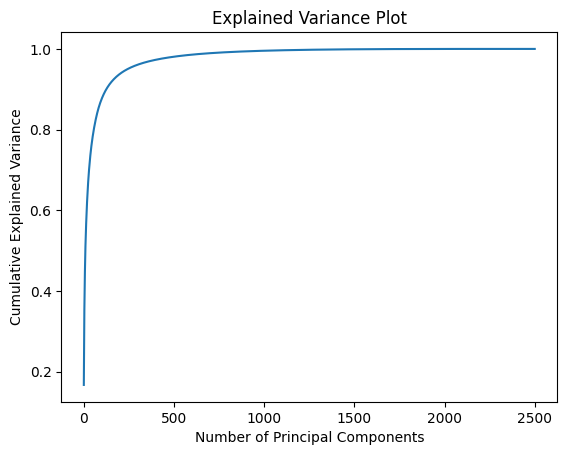

In [ ]:
plt.plot(cumulative_variance)
plt.xlabel("Number of Principal Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("Explained Variance Plot")
plt.show()

In [ ]:
k = 100
components = sorted_eigenvectors [: , : k ]

In [ ]:
compressed_data = np . dot ( centered_data , components )

In [ ]:
# Reconstruct the image from compressed data
decompressed_data = np . dot ( compressed_data , components . T ) + mean

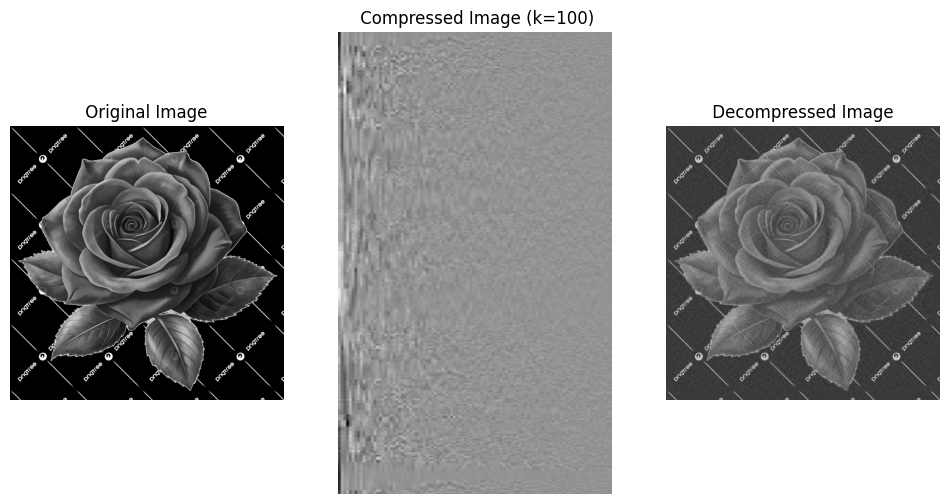

In [ ]:
plt.figure ( figsize =(12 , 6) )
# Original Image
plt.subplot (1 , 3 , 1)
plt.imshow ( img_array , cmap ="gray")
plt.title (" Original Image ")
plt.axis ("off")
# Compressed Representation
plt.subplot (1 , 3 , 2)
plt.imshow (compressed_data.real, cmap ="gray", aspect ="auto")
plt.title ( f" Compressed Image (k={k})")
plt.axis ("off")
# Decompressed Image
plt.subplot (1 , 3 , 3)
plt.imshow ( decompressed_data.real , cmap ="gray")
plt.title (" Decompressed Image ")
plt.axis ("off")

plt.show()